## Necessary imports

In [1]:
import os
from IPython.display import display
import pandas as pd
pd.options.display.max_rows = 100
# pd.options.display.max_colwidth = 200

import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from math import sqrt
import consts

%load_ext autoreload
%autoreload 2

/Users/aliaksandr.lashkov/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:17: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.


train: (71236, 47)
test: (30530, 48)
y: (71236,)
9.54% of the data is missing


## Load data

In [2]:
data = consts.data
train = consts.train
test = consts.test
y = consts.y

In [7]:
from sklearn.decomposition import PCA
from sklearn.utils.fixes import loguniform
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, ParameterSampler
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, SpectralClustering, AgglomerativeClustering, DBSCAN, \
    Birch
from sklearn.preprocessing import PolynomialFeatures
from sklearn.mixture import GaussianMixture
from hdbscan import HDBSCAN


from ads.utils.feature import get_search_space_fit_features

features, fes_steps = get_search_space_fit_features(consts.FEATURES_DIR)

n_jobs = 1

fu = FeatureUnion(features, n_jobs=n_jobs, verbose=0)
model = Pipeline(
    steps=[
        ('fes', fu),
#         ('sq', PolynomialFeatures(degree=2, interaction_only=True)),
        ('pca', PCA(n_components=5)),
#         ('sq', PolynomialFeatures(degree=3)),
#         ('model', KMeans(n_clusters=10, n_jobs=n_jobs)),
        # ('model', AffinityPropagation(damping=0.5, max_iter=200, convergence_iter=15, copy=True, preference=None, affinity='euclidean', verbose=False)),  # lots of ram
        # ('model', MeanShift(bandwidth=None, seeds=None, bin_seeding=False, min_bin_freq=1, cluster_all=True, n_jobs=n_jobs, max_iter=300)),
        # ('model', SpectralClustering(n_clusters=2, eigen_solver=None, n_components=None, random_state=None, n_init=10, gamma=1.0,
        #                     affinity='rbf', n_neighbors=10, eigen_tol=0.0, assign_labels='kmeans', degree=3, coef0=1, kernel_params=None, n_jobs=n_jobs)),  # lots of ram
        # ('model', AgglomerativeClustering(n_clusters=2, affinity='euclidean', memory='./cash', connectivity=None, compute_full_tree='auto', linkage='ward', distance_threshold=None)),
#         ('model', DBSCAN(eps=1.5, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', 
#                          leaf_size=10, p=None, n_jobs=n_jobs)),  # no predict method
#         ('model', Birch(threshold=0.3, branching_factor=50, n_clusters=2, compute_labels=True, copy=True)),  # 0.47
        # ('model', LogisticRegression(n_jobs=n_jobs, max_iter=1000)),
        ('model', GaussianMixture(n_components=2, covariance_type='full', tol=0.001, reg_covar=1e-06, max_iter=100, n_init=1,
                                  init_params='kmeans', weights_init=None, means_init=None, precisions_init=None, random_state=None,
                                  warm_start=False, verbose=0, verbose_interval=10)),
    ])
param_distributions = {
    # 'model__n_init': randint(10, 100),
    # 'model__tol': loguniform(1e-4, 1e4),
    # 'model__algorithm': ['auto', 'full', 'elkan'],

}
param_distributions.update(fes_steps)
model.set_params(**list(ParameterSampler(param_distributions, n_iter=1))[0])

# model = RandomizedSearchCV(pipe, param_distributions, n_iter=1, cv=5, scoring='accuracy', n_jobs=n_jobs, verbose=0)
# model.fit(train.sample(frac=0.1), y=None)
model.fit(data)

# model.fit(train, y)
# print(model.best_score_)
# print(model.best_estimator_)
# print(model.best_estimator_.labels_)
# print(model.labels_)


Pipeline(memory=None,
         steps=[('fes',
                 FeatureUnion(n_jobs=1,
                              transformer_list=[('chlorpropamide',
                                                 Feature(cols=['chlorpropamide'], dtype=<class 'numpy.float32'>, name='chlorpropamide', steps=(SimpleImputer(add_indicator=False, copy=True, fill_value='unk_val', missing_values=nan, strategy='constant', verbose=0), OrdinalEncoder(categories=[['No', 'Up', 'Steady', 'Down...
                 PCA(copy=True, iterated_power='auto', n_components=20,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('model',
                 GaussianMixture(covariance_type='full', init_params='kmeans',
                                 max_iter=100, means_init=None, n_components=2,
                                 n_init=1, precisions_init=None,
                                 random_state=None, reg_covar=1e-06, tol=0.001,
                 

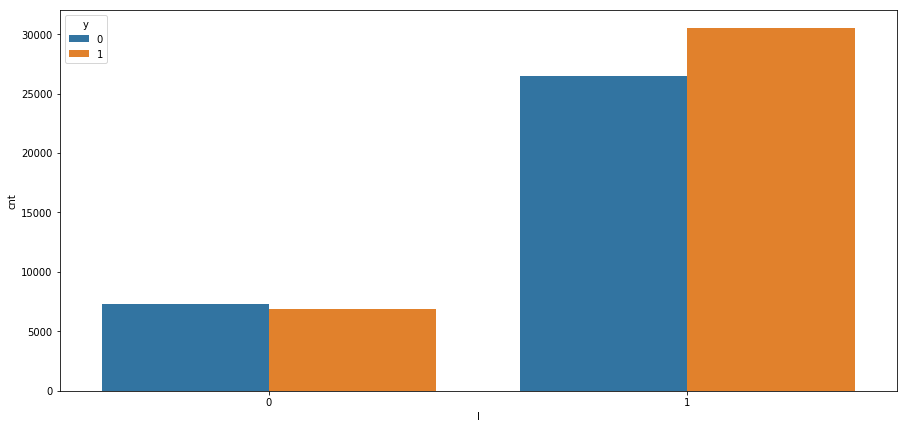

In [8]:
dt = pd.DataFrame({
#     'l': model.steps[-1][1].labels_,
    'l': model.predict(train),
    'y': y,
})
dt['cnt'] = dt.groupby(['l', 'y'])['y'].transform('count')
fig, ax = plt.subplots(figsize=(15, 7))
sns.barplot(x='l', y='cnt', data=dt, hue='y', ax=ax)

In [18]:
set(model.steps[-1][1].labels_)

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}

## Columns exploration

In [11]:
data.columns

Index(['race', 'gender', 'age', 'weight', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'payer_code', 'medical_specialty', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted_NO',
       'index'],
      dtype='object')

In [12]:
data.dtypes

race                         object
gender                       object
age                          object
weight                       object
admission_type_id            object
discharge_disposition_id     object
admission_source_id          object
time_in_hospital              int64
payer_code                   object
medical_specialty            object
num_lab_procedures            int64
num_procedures                int64
num_medications               int64
number_outpatient             int64
number_emergency              int64
number_inpatient              int64
diag_1                       object
diag_2                       object
diag_3                       object
number_diagnoses              int64
max_glu_serum                object
A1Cresult                    object
metformin                    object
repaglinide                  object
nateglinide                  object
chlorpropamide               object
glimepiride                  object
acetohexamide               

#### klj


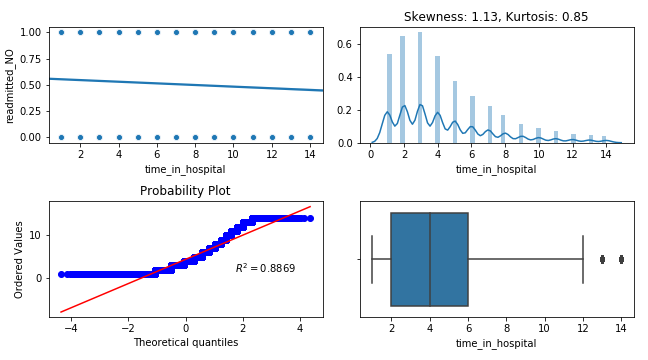


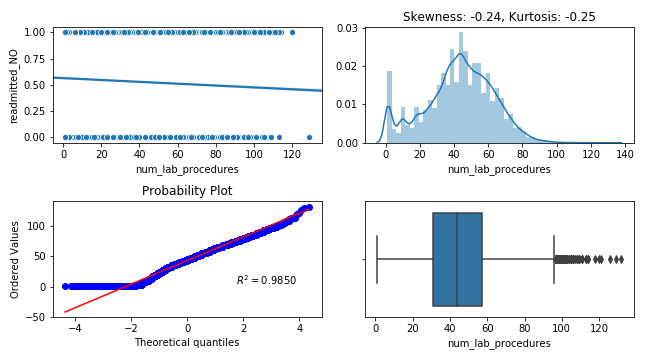


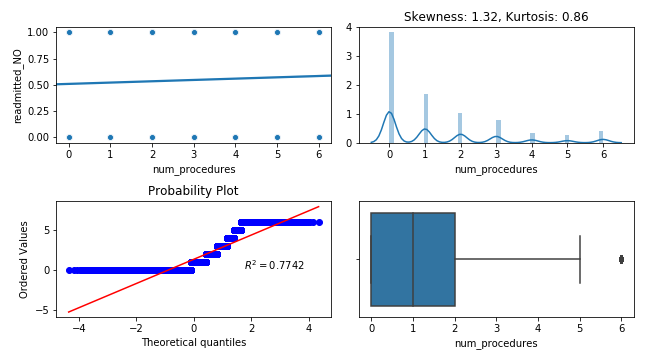


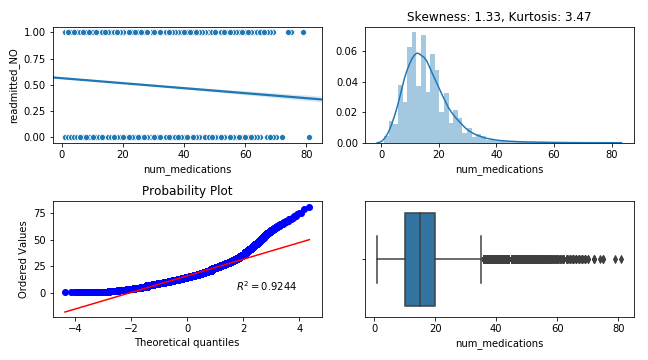


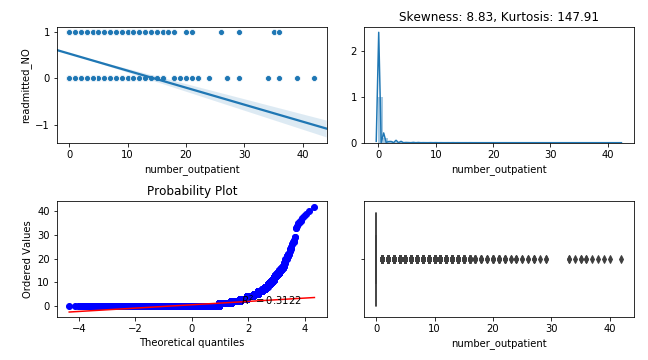


...


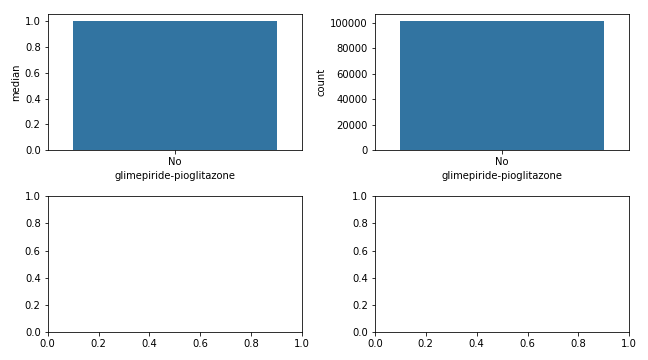


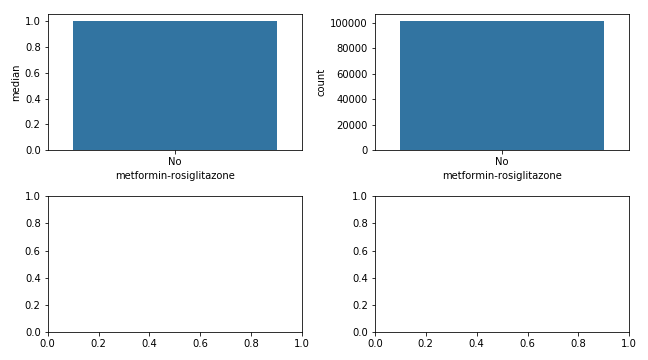


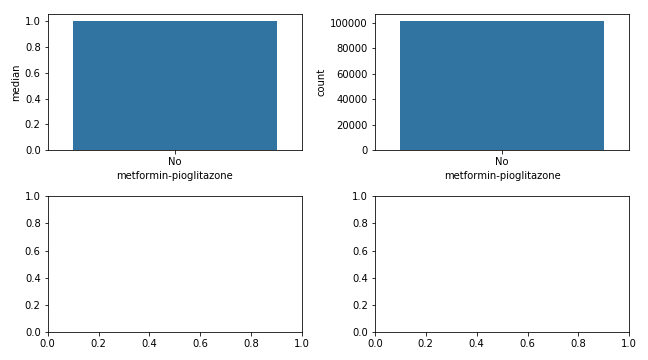


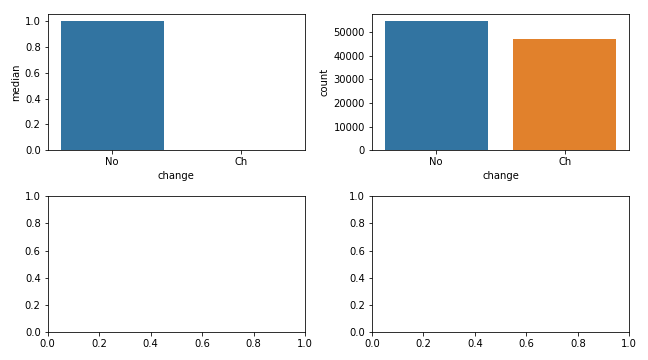


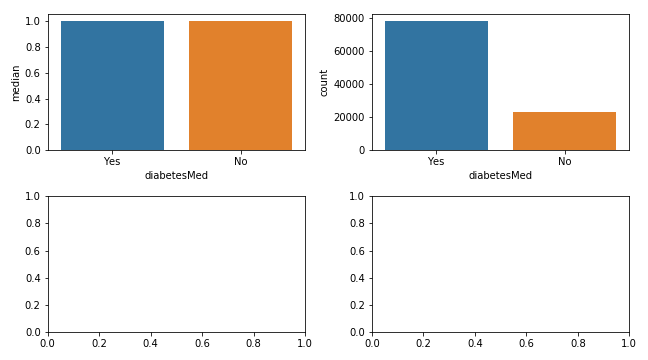

In [5]:
custom_describe(data, y)

In [1]:
data['medical_specialty'].unique()

NameError: name 'data' is not defined


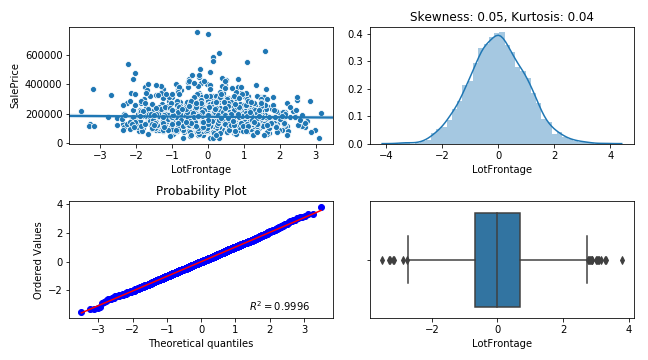

In [169]:
df = pd.DataFrame({
    'LotFrontage': np.random.randn(data['LotFrontage'].values.shape[0]), 
    'SalePrice': data['SalePrice'].values
})
df.loc[df['LotFrontage'] > 200, 'LotFrontage'] = df['LotFrontage'].median()
# df.loc[df['SalePrice'] > 450000, 'SalePrice'] = df['SalePrice'].median()
# df['LotFrontage'] = (df['LotFrontage'] - df['LotFrontage'].max()) / (df['LotFrontage'].max() - df['LotFrontage'].min())
# df['LotFrontage'] = (df['LotFrontage'] - df['LotFrontage'].mean()) / (df['LotFrontage'].std())
# df['LotFrontage'] = np.log(df['LotFrontage'] + 1)
# df['LotFrontage'] = np.power(df['LotFrontage'] + 1, 1/2)
# df['LotFrontage'] = (df['LotFrontage'] - df['LotFrontage'].mean()) / (df['LotFrontage'].std())
# df['LotFrontage'] = (df['LotFrontage'] - df['LotFrontage'].max()) / (df['LotFrontage'].max() - df['LotFrontage'].min())

display_num_col_info(df, 'LotFrontage', df['SalePrice'])


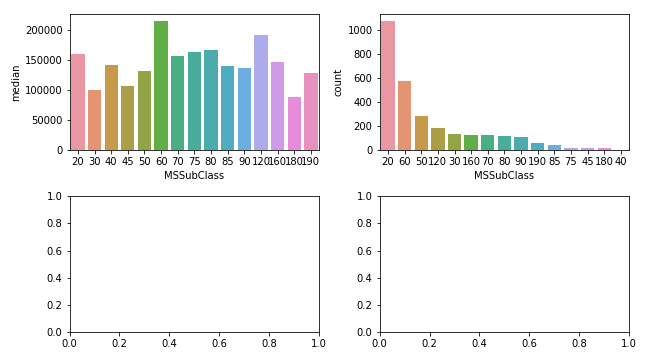

In [71]:
display_cat_col_info(data, 'MSSubClass', y)

#### klj

#### klj

#### klj

#### klj

#### klj

#### klj

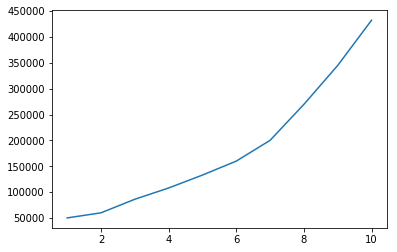

In [21]:
plt.plot(train.groupby(['OverallQual'])['SalePrice'].median())

## Check target for skewness and kurtosis

0.1212103673013655
0.8026555069117713


((array([-3.30513952, -3.04793228, -2.90489705, ...,  2.90489705,
          3.04793228,  3.30513952]),
  array([10.46024211, 10.47194981, 10.54270639, ..., 13.34550693,
         13.5211395 , 13.53447303])),
 (0.3982622308161888, 12.024050901109383, 0.9953761475636613))

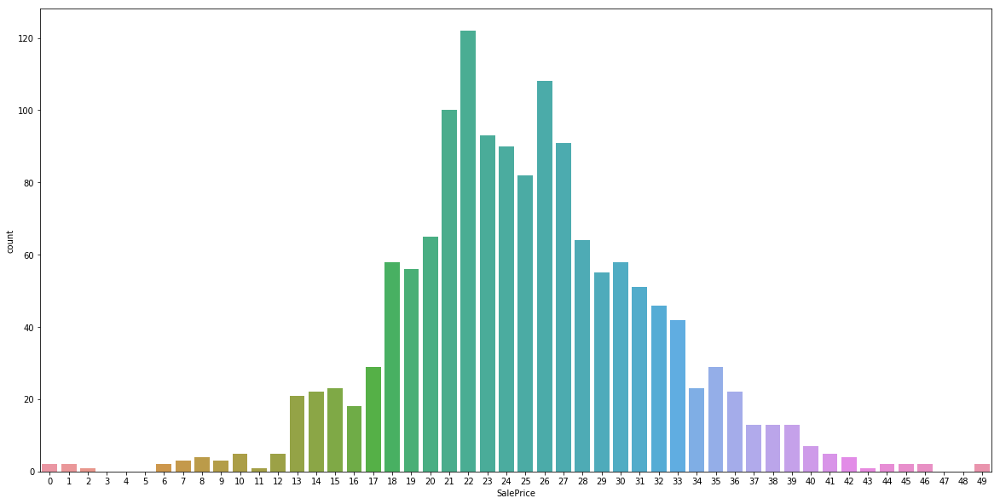

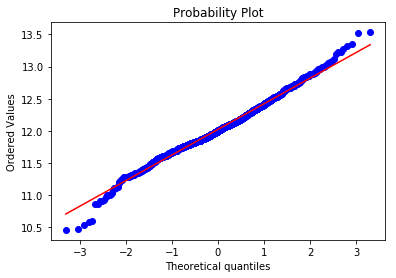

In [13]:
arr = np.log(y)

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# ax.hist(y)
# sns.distplot(np.log(y + 1))
sns.countplot(pd.cut(arr, bins=50, labels=range(50)))

from scipy.stats import kurtosis, skew, probplot
print(skew(arr))
print(kurtosis(arr))
plt.figure()
probplot(arr, plot=plt)

In [42]:
!kaggle competitions submit -c house-prices-advanced-regression-techniques -f ./data/submission_0.csv -m "Message"

100%|██████████████████████████████████████| 21.1k/21.1k [00:02<00:00, 7.34kB/s]
Successfully submitted to House Prices: Advanced Regression Techniques

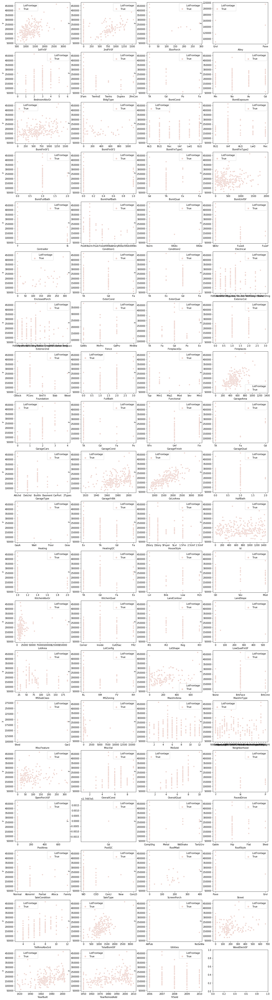

In [7]:
import math

n = len(dfs)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, df in enumerate(dfs):
#     if train[col].dtype != object:
#         fill_val = train[col].max() * 2
#     else:
#         fill_val = "None"
#     data = train[col].fillna(fill_val)
    sns.scatterplot(x=df.iloc[:, 1], y=df.y, hue=df.LotFrontage.isna(), ax=ax[i // ncols, i % ncols])

## Take a look at unique values count

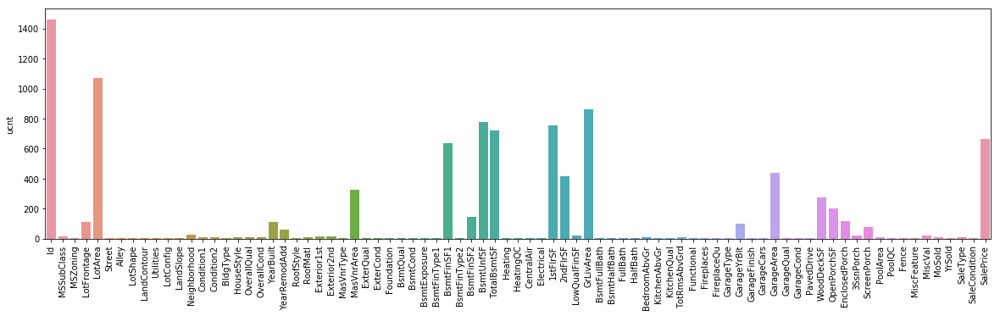

In [8]:
plt.subplots(figsize=(20,5))
g = sns.barplot(describe.index, describe.ucnt)
plt.xticks(rotation=90);

## Are there constant features?

In [20]:
df = pd.concat([train.loc[:, ~train.columns.isin(y)], test]).nunique(dropna=False).sort_values(ascending=True)
print("# constant features:", df.loc[df <= 1])

# constant features: Series([], dtype: int64)


## Plot nans within data

## Columns with nans

In [11]:
df = train.isin([None, np.nan]).sum(axis=0)
df.loc[df > 0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

## Categoricals distribution

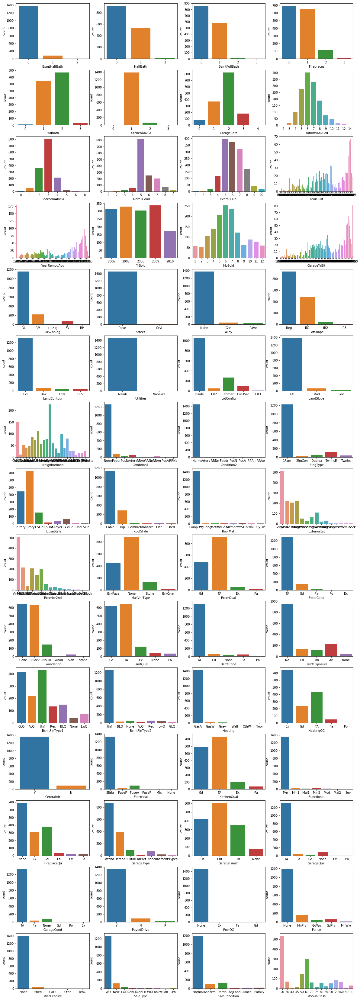

In [12]:
import math

columns = discrete + year + category
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    if train[col].dtype != object:
        fill_val = train[col].max() * 2
    else:
        fill_val = "None"
    data = train[col].fillna(fill_val)
    sns.countplot(data, ax=ax[i // ncols, i % ncols])

## Numericals distribution

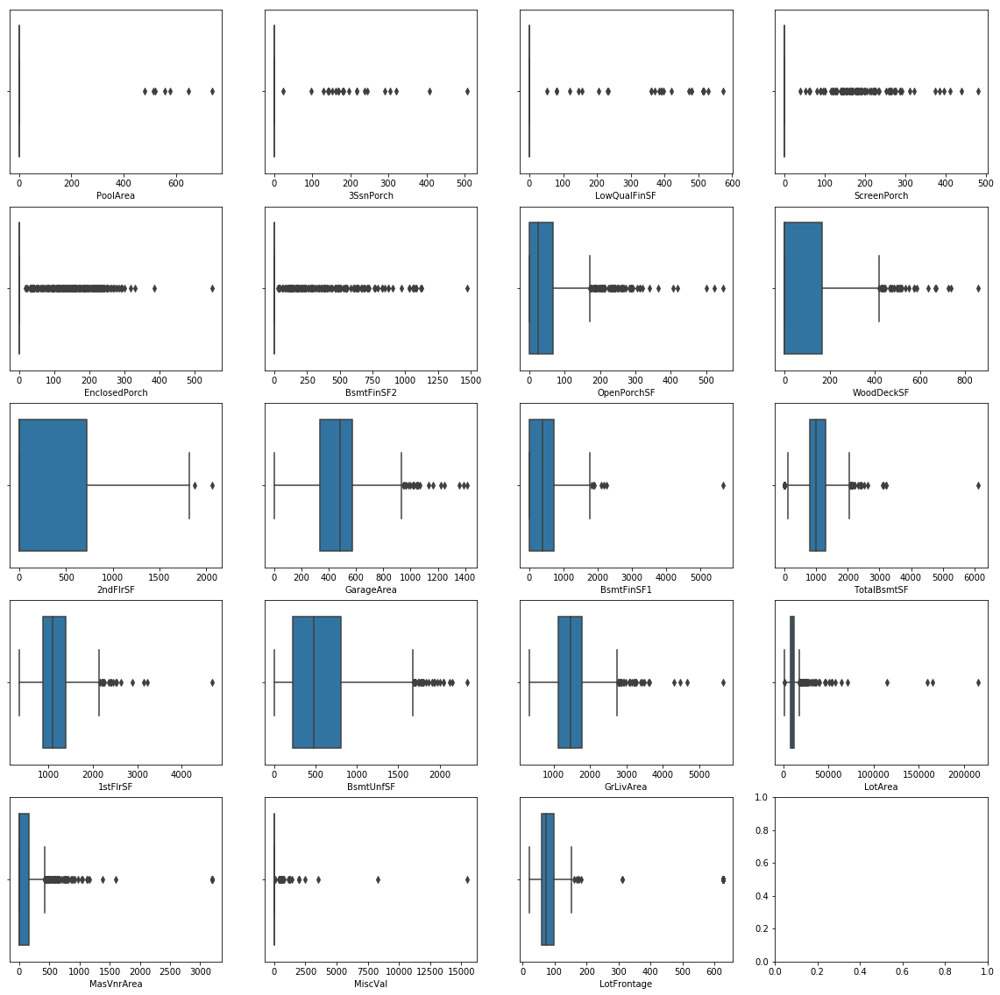

In [13]:
import math

columns = area + numeric
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    if train[col].dtype != object:
        fill_val = train[col].max() * 2
    else:
        fill_val = "None"
    data = train[col].fillna(fill_val)
    sns.boxplot(data, ax=ax[i // ncols, i % ncols])

## Scatter plots between numerics

/home/alex/anaconda3/envs/py36/lib/python3.6/site-packages/pandas/core/indexing.py:635: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item_labels[indexer[info_axis]]] = value
/home/alex/anaconda3/envs/py36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


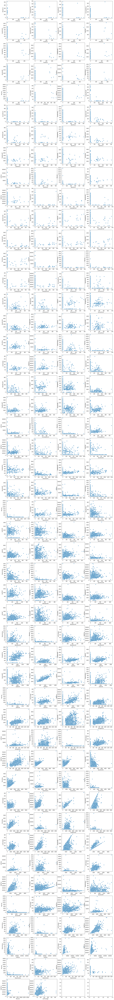

In [14]:
import math
from itertools import combinations

columns = list(combinations(area + numeric + y, 2))
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    col = list(col)
    data = train[col]
    for c in col:
        fill_val = train[col].max() * 10
        data.loc[:, c] = data[c].fillna(fill_val)
    sns.scatterplot(x=col[0], y=col[1], data=data, ax=ax[i // ncols, i % ncols])

## Numericals - target plot

/home/alex/anaconda3/envs/py36/lib/python3.6/site-packages/pandas/core/generic.py:6130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


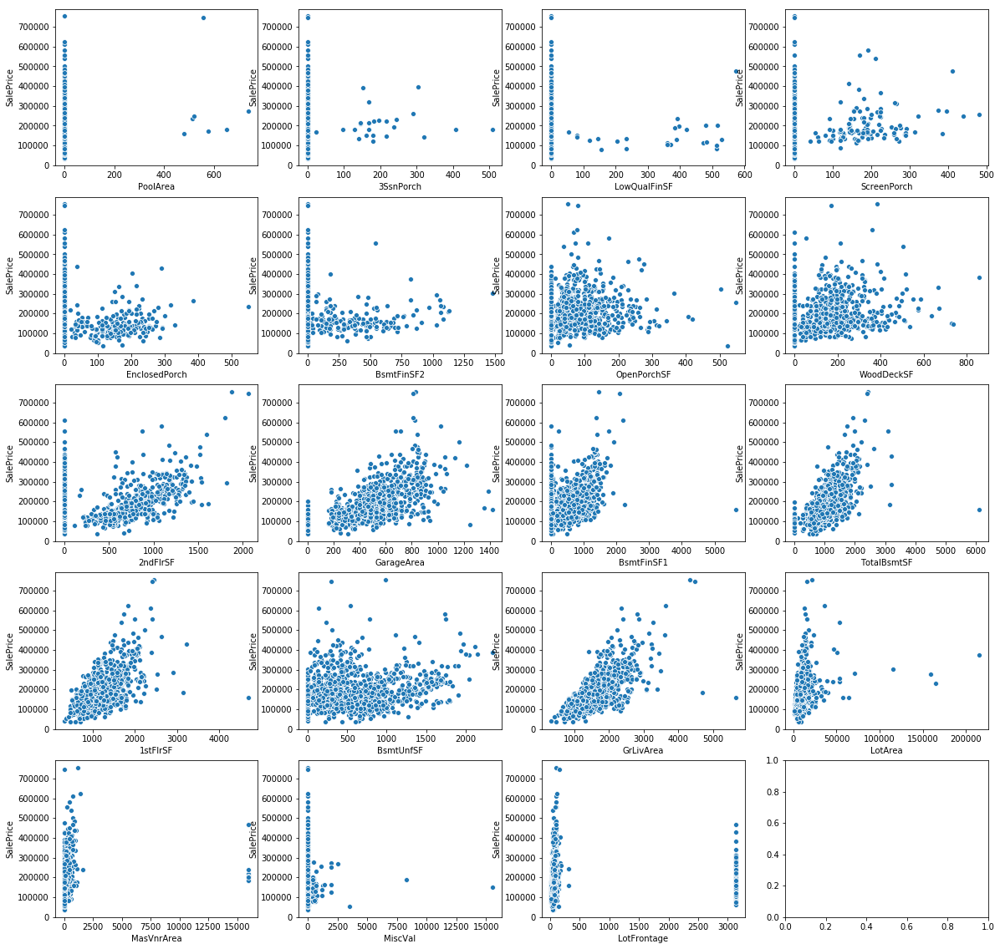

In [15]:
import math
from itertools import combinations

columns = area + numeric
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    data = train[[col] + y]
    fill_val = train[col].max() * 10
    data.loc[:, col].fillna(fill_val, inplace=True)
    sns.scatterplot(x=col, y=y[0], data=data, ax=ax[i // ncols, i % ncols])

## Scatter plots between numerics with colored by target

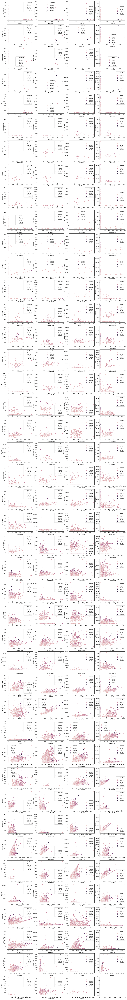

In [16]:
import math
from itertools import combinations

columns = list(combinations(area + numeric, 2))
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    col = list(col)
    data = train[col + y]
    for c in col:
        fill_val = train[col].max() * 10
        data.loc[:, c].fillna(fill_val, inplace=True)
    sns.scatterplot(x=col[0], y=col[1], data=data, hue=y[0], ax=ax[i // ncols, i % ncols])

## Categoricals - target plots

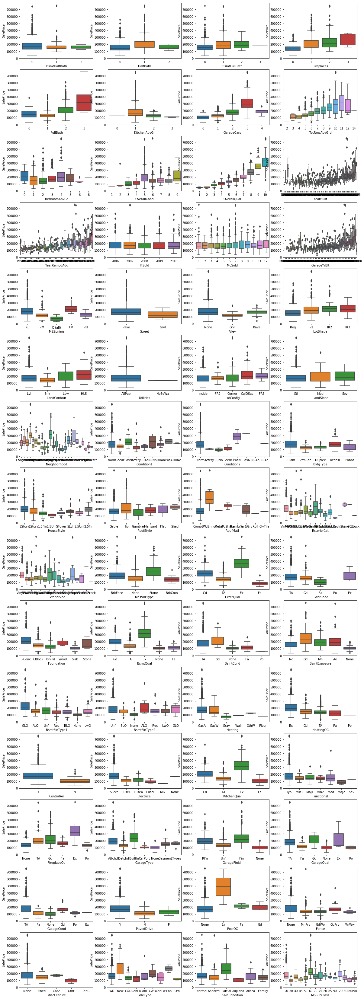

In [17]:
import math

columns = discrete + year + category 
n = len(columns)
ncols = 4
nrows = math.ceil(n / ncols)
fig, ax = plt.subplots(nrows, ncols, figsize=(20, nrows * 4))
for i, col in enumerate(columns):
    if train[col].dtype != object:
        fill_val = train[col].max() * 2
    else:
        fill_val = "None"
    data = train[col].fillna(fill_val)
    data = pd.concat([data, train[y]], axis=1)
    sns.boxplot(x=col, y=y[0], data=data, ax=ax[i // ncols, i % ncols])

## Correlations

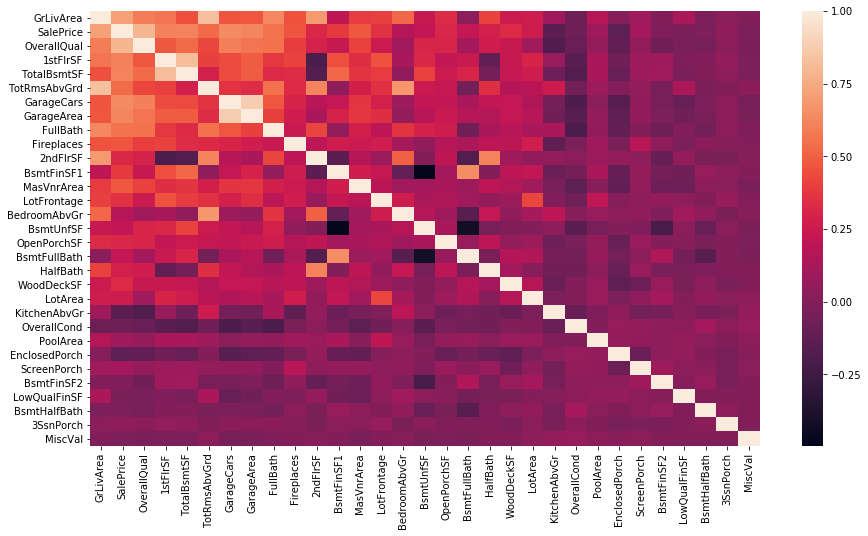

In [18]:
ordered_cols = train[area + numeric + y + discrete].corr().abs().mean(axis=0).sort_values(ascending=False).index
corrs = train.loc[:, ordered_cols].corr()
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
sns.heatmap(corrs)